# Network metrics other

In [ ]:
%cd work/notebooks

# Import modules and R
import numpy as np, pandas as pd
%load_ext rpy2.ipython
%load_ext autoreload
%autoreload 2

# Import local code
import sys
sys.path.append('/home/jovyan/work/code')
from gradientVersion import *
from processing_helpers import *
from analysis_helpers import *
from mri_maps import *
%R source("../code/Rplots.R");
%R source("../code/brainPlots.R");

[Errno 2] No such file or directory: 'work/notebooks'
/home/jovyan/work/notebooks
The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


System has not been booted with systemd as init system (PID 1). Can't operate.
Failed to connect to bus: Host is down


In [4]:
dme_3d_ds5 = gradientVersion().fit('hcp_3donors_ds5')
hcp_scores = dme_3d_ds5.clean_scores()
null_scores = np.load("../outputs/permutations/hcp_3d_ds5_spin_5000_v2.npy")

# dme_ds8 = gradientVersion().fit('hcp_ds8')
# hcp_scores = dme_ds8.clean_scores()
# null_scores = np.load("../outputs/permutations/hcp_ds8_spin_5000_v2.npy")
# dme_ds8 = gradientVersion().fit('hcp_ds8')
# dme_ds5 = gradientVersion().fit('hcp_ds5')

New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=hcp_3donors_ds5


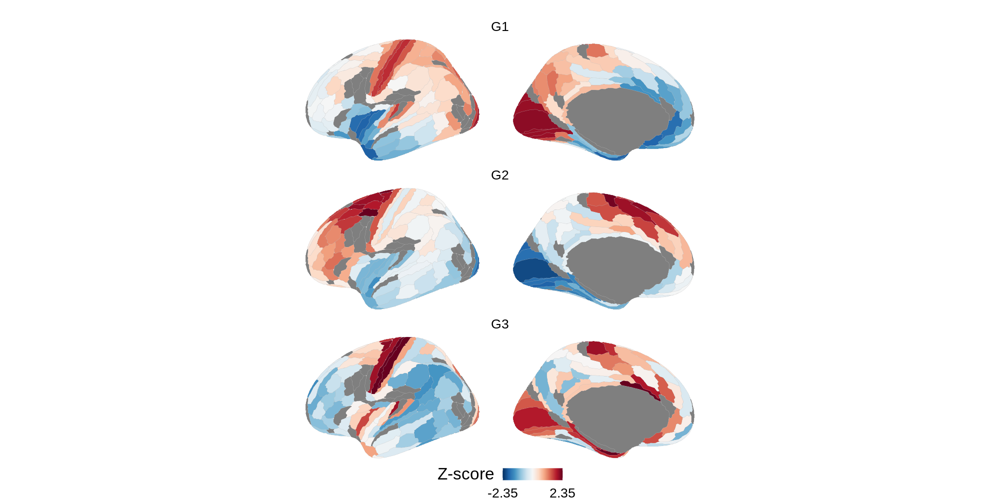

In [5]:
%%R -i hcp_scores -w 20 -h 10 -u in -r 100
plot_hcp(hcp_scores, facet='w') + theme(text=element_text(size=24))

## Module connectivity matrices

In [22]:
pd.read_csv("../data/mesulam_ve_yeo_colors.csv")

,atlas,label,color
0,Mesulam,Idiotypic,#80B1D3
1,Mesulam,Unimodal,#FB8072
2,Mesulam,Paralimbic,#FFFFB3
3,Mesulam,Heteromodal,#BEBADA
4,vonEconomo,Sensory 1,#fffb00
5,vonEconomo,Sensory 2,#f59505
6,vonEconomo,Association 1,#220ced
7,vonEconomo,Motor,#6f057a
8,vonEconomo,Limbic,#00fffb
9,vonEconomo,Association 2,#067a08


In [27]:
yeo = np.loadtxt("../data/HCP_Yeo_asymmetric.txt")
yeo_names = ['Visual','Somatomotor','Dorsal Attention','Ventral Attention','Limbic','Frontoparietal','Default']
yeo_colors = ['#00660066', '#0066CC', '#009900', '#FF00FF', '#FFFF99', '#FF80000', '#FF6666']

df_modules = (get_labels_hcp().to_frame()
 .assign(module = yeo)
 .assign(module_name = lambda x: x['module'].map({i+1:name for i,name in enumerate(yeo_names)}))
 .assign(module_colors = lambda x: x['module'].map({i+1:name for i,name in enumerate(yeo_colors)}))
 .sort_values('module')
)
df_modules

,label,module,module_name,module_colors
id,,,,
300,H,0.0,NaN,NaN
299,PreS,0.0,NaN,NaN
110,Pir,0.0,NaN,NaN
120,H,0.0,NaN,NaN
290,Pir,0.0,NaN,NaN
...,...,...,...,...
177,TE1m,7.0,Default,#FF6666
194,RSC,7.0,Default,#FF6666
206,SFL,7.0,Default,#FF6666


In [ ]:
%%R -i df_modules -w 10 -h 5 -u in -r 100
options(repos = c(
  ggseg = 'https://ggseg.r-universe.dev',
  CRAN = 'https://cloud.r-project.org'))

# Install some packages
install.packages('ggsegYeo2011')
library(ggsegYeo2011)
# yeo7
# df_modules %>% rename(region=label) %>% 
# mutate(module_name = factor(module_name, ordered=T, levels=unique(.$module_name))) %>% 
# ggseg(atlas=glasser, position='stack', mapping=aes(fill=module_colors)) + 
# scale_color_identity(aes(labels=module_name)) +
# scale_fill_manual(values=cols25(12))

































































































































































































* installing *source* package ‘protolite’ ...
** package ‘protolite’ successfully unpacked and MD5 sums checked
** using staged installation
Package protobuf was not found in the pkg-config search path.
Perhaps you should add the directory containing `protobuf.pc'
to the PKG_CONFIG_PATH environment variable
No package 'protobuf' found


Using PKG_CFLAGS=
Using PKG_LIBS=-lprotobuf
Using C++17 compiler: aarch64-conda-linux-gnu-c++ -std=gnu++17
Using libprotoc 3.20.1 from /opt/conda/bin/protoc
aarch64-conda-linux-gnu-c++ -std=gnu++14 -I"/opt/conda/lib/R/include" -DNDEBUG  -I'/opt/conda/lib/R/library/Rcpp/include' -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib  -fvisibility=hidden -fpic  -fvisibility-inlines-hidden -fmessage-length=0 -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c RcppExports.cpp -o RcppExports.o


** libs


aarch64-conda-linux-gnu-c++ -std=gnu++14 -I"/opt/conda/lib/R/include" -DNDEBUG  -I'/opt/conda/lib/R/library/Rcpp/include' -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib  -fvisibility=hidden -fpic  -fvisibility-inlines-hidden -fmessage-length=0 -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c geobuf.cpp -o geobuf.o


geobuf.cpp: In function 'RawVector cpp_serialize_geobuf(List, int)':
geobuf.cpp:252:30: warning: 'int google::protobuf::MessageLite::ByteSize() const' is deprecated: Please use ByteSizeLong() instead [-Wdeprecated-declarations]
  252 |   int size = message.ByteSize();
      |              ~~~~~~~~~~~~~~~~^~
In file included from /opt/conda/include/google/protobuf/any.h:38,
                 from /opt/conda/include/google/protobuf/generated_message_util.h:52,
                 from geobuf.pb.h:26,
                 from geobuf.cpp:1:
/opt/conda/include/google/protobuf/message_lite.h:382:7: note: declared here
  382 |   int ByteSize() const { return internal::ToIntSize(ByteSizeLong()); }
      |       ^~~~~~~~


aarch64-conda-linux-gnu-c++ -std=gnu++14 -I"/opt/conda/lib/R/include" -DNDEBUG  -I'/opt/conda/lib/R/library/Rcpp/include' -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib  -fvisibility=hidden -fpic  -fvisibility-inlines-hidden -fmessage-length=0 -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c geobuf.pb.cc -o geobuf.pb.o


geobuf.pb.cc:39:116: error: 'constinit' variable 'geobuf::_Data_Feature_default_instance_' does not have a constant initializer
   39 | PROTOBUF_ATTRIBUTE_NO_DESTROY PROTOBUF_CONSTINIT PROTOBUF_ATTRIBUTE_INIT_PRIORITY1 Data_FeatureDefaultTypeInternal _Data_Feature_default_instance_;
      |                                                                                                                    ^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
geobuf.pb.cc:39:116: error: 'geobuf::Data_FeatureDefaultTypeInternal{geobuf::Data_FeatureDefaultTypeInternal::<unnamed union>{geobuf::Data_Feature{google::protobuf::MessageLite{((& geobuf::Data_Feature::_ZTVN6geobuf12Data_FeatureE) + 16), google::protobuf::internal::InternalMetadata{0}}, google::protobuf::internal::HasBits<1>{uint32_t [1]()}, google::protobuf::internal::CachedSize{std::atomic<int>{std::__atomic_base<int>{0}}}, google::protobuf::RepeatedPtrField<geobuf::Data_Value>{google::protobuf::internal::RepeatedPtrFieldBase{0, 0, 0, 0}}, google::prot

aarch64-conda-linux-gnu-c++ -std=gnu++17 -I"/opt/conda/lib/R/include" -DNDEBUG -DSTRICT_R_HEADERS -I'/opt/conda/lib/R/library/Rcpp/include' -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib  -I../inst/include/ -fpic  -fvisibility-inlines-hidden -fmessage-length=0 -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c RcppExports.cpp -o RcppExports.o
aarch64-conda-linux-gnu-c++ -std=gnu++17 -I"/opt/conda/lib/R/include" -DNDEBUG -DSTRICT_R_HEADERS -I'/opt/conda/lib/R/library/Rcpp/include' -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib  -I../inst/include/ -fpic  -fvisibility-inlines-hidden -fmessage-length=0 -ftree-vectorize -fPIC -fsta

installing to /opt/conda/lib/R/library/00LOCK-geometries/00new/geometries/libs
** R
** inst
** byte-compile and prepare package for lazy loading
** help
*** installing help indices
** building package indices
** installing vignettes
** testing if installed package can be loaded from temporary location
** checking absolute paths in shared objects and dynamic libraries
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (geometries)
* installing *source* package ‘rapidjsonr’ ...
** package ‘rapidjsonr’ successfully unpacked and MD5 sums checked
** using staged installation
** R
** inst
** byte-compile and prepare package for lazy loading
** help
*** installing help indices
** building package indices
** testing if installed package can be loaded from temporary location
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of tempora

aarch64-conda-linux-gnu-cc -I"/opt/conda/lib/R/include" -DNDEBUG   -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib   -fpic  -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c 000.init.c -o 000.init.o
aarch64-conda-linux-gnu-cc -I"/opt/conda/lib/R/include" -DNDEBUG   -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib   -fpic  -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c allocMatrix2.c -o allocMatr

In file included from rowRanksWithTies_lowlevel.h:23,
                 from rowRanksWithTies.c:10:
rowRanksWithTies_lowlevel_template.h: In function 'rowRanksWithTies_Average_dbl':
rowRanksWithTies_lowlevel_template.h:191:42: warning: iteration 2147483647 invokes undefined behavior [-Waggressive-loop-optimizations]
  191 |       for (kk=firstTie; kk < aboveTie; kk++) {
      |                                        ~~^~
rowRanksWithTies_lowlevel_template.h:191:28: note: within this loop
  191 |       for (kk=firstTie; kk < aboveTie; kk++) {
      |                         ~~~^~~~~~~~~~
In file included from rowRanksWithTies_lowlevel.h:28:
rowRanksWithTies_lowlevel_template.h: In function 'rowRanksWithTies_Average_int':
rowRanksWithTies_lowlevel_template.h:191:42: warning: iteration 2147483647 invokes undefined behavior [-Waggressive-loop-optimizations]
  191 |       for (kk=firstTie; kk < aboveTie; kk++) {
      |                                        ~~^~
rowRanksWithTies_lowlevel_te

aarch64-conda-linux-gnu-cc -I"/opt/conda/lib/R/include" -DNDEBUG   -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib   -fpic  -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c rowSums2.c -o rowSums2.o
aarch64-conda-linux-gnu-cc -I"/opt/conda/lib/R/include" -DNDEBUG   -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib   -fpic  -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c rowVars.c -o rowVars.o
aarc

installing to /opt/conda/lib/R/library/00LOCK-matrixStats/00new/matrixStats/libs
** R
** inst
** byte-compile and prepare package for lazy loading
** help
*** installing help indices
** building package indices
** installing vignettes
** testing if installed package can be loaded from temporary location
** checking absolute paths in shared objects and dynamic libraries
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (matrixStats)
* installing *source* package ‘RNifti’ ...
** package ‘RNifti’ successfully unpacked and MD5 sums checked
** using staged installation


checking for gcc... aarch64-conda-linux-gnu-cc
checking whether the C compiler works... yes
checking for C compiler default output file name... a.out
checking for suffix of executables... 
checking whether we are cross compiling... no
checking for suffix of object files... o
checking whether the compiler supports GNU C... yes
checking whether aarch64-conda-linux-gnu-cc accepts -g... yes
checking for aarch64-conda-linux-gnu-cc option to enable C11 features... none needed
checking for library containing inflate... -lz
configure: creating ./config.status
config.status: creating src/Makevars


** libs


aarch64-conda-linux-gnu-c++ -std=gnu++14 -I"/opt/conda/lib/R/include" -DNDEBUG -DNDEBUG -DHAVE_ZLIB -DUSING_R -DRNIFTI_NIFTILIB_DEDUPLICATE -I../inst/include  -I'/opt/conda/lib/R/library/Rcpp/include' -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib   -fpic  -fvisibility-inlines-hidden -fmessage-length=0 -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c main.cpp -o main.o
aarch64-conda-linux-gnu-cc -I"/opt/conda/lib/R/include" -DNDEBUG -DNDEBUG -DHAVE_ZLIB -DUSING_R -DRNIFTI_NIFTILIB_DEDUPLICATE -I../inst/include  -I'/opt/conda/lib/R/library/Rcpp/include' -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib   -fpic  -ftree-vectorize 

installing to /opt/conda/lib/R/library/00LOCK-RNifti/00new/RNifti/libs
** R
** inst
** byte-compile and prepare package for lazy loading
** help
*** installing help indices
** building package indices
** testing if installed package can be loaded from temporary location
** checking absolute paths in shared objects and dynamic libraries
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (RNifti)
* installing *source* package ‘R.methodsS3’ ...
** package ‘R.methodsS3’ successfully unpacked and MD5 sums checked
** using staged installation
** R
** inst
** byte-compile and prepare package for lazy loading
** help
*** installing help indices
** building package indices
** testing if installed package can be loaded from temporary location
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (R.met

Using PKG_CFLAGS=
Using PKG_LIBS=-ljq
--------------------------- [ANTICONF] --------------------------------
Configuration failed because libjq was not found. Try installing:
 * deb: libjq-dev (Debian, Ubuntu).
 * rpm: jq-devel (Fedora, EPEL)
 * csw: libjq_dev (Solaris)
 * brew: jq (OSX)
If  is already installed set INCLUDE_DIR and LIB_DIR manually via:
R CMD INSTALL --configure-vars='INCLUDE_DIR=... LIB_DIR=...'
-------------------------- [ERROR MESSAGE] ---------------------------
<stdin>:1:10: fatal error: jq.h: No such file or directory
compilation terminated.
--------------------------------------------------------------------


* installing *source* package ‘terra’ ...
** package ‘terra’ successfully unpacked and MD5 sums checked
** using staged installation


configure: CC: aarch64-conda-linux-gnu-cc
configure: CXX: aarch64-conda-linux-gnu-c++ -std=gnu++14
checking for gdal-config... /opt/conda/bin/gdal-config
checking gdal-config usability... yes
configure: GDAL: 3.6.2
checking GDAL version >= 2.0.1... yes
checking for gcc... aarch64-conda-linux-gnu-cc
checking whether the C compiler works... yes
checking for C compiler default output file name... a.out
checking for suffix of executables... 
checking whether we are cross compiling... no
checking for suffix of object files... o
checking whether the compiler supports GNU C... yes
checking whether aarch64-conda-linux-gnu-cc accepts -g... yes
checking for aarch64-conda-linux-gnu-cc option to enable C11 features... none needed
checking for stdio.h... yes
checking for stdlib.h... yes
checking for string.h... yes
checking for inttypes.h... yes
checking for stdint.h... yes
checking for strings.h... yes
checking for sys/stat.h... yes
checking for sys/types.h... yes
checking for unistd.h... yes
chec

ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed
ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed
ERROR 1: PROJ: proj_create: unrecognized format / unknown name
ERROR 1: PROJ: proj_create: unrecognized format / unknown name
configure: error: OGRCoordinateTransformation() does not return a coord.trans: PROJ not available?
ERROR: configuration failed for package ‘terra’
* removing ‘/opt/conda/lib/R/library/terra’
* installing *source* package ‘sp’ ...
** package ‘sp’ successfully unpacked and MD5 sums checked
** using staged installation
** libs


aarch64-conda-linux-gnu-cc -I"/opt/conda/lib/R/include" -DNDEBUG   -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib   -fpic  -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c Rcentroid.c -o Rcentroid.o
aarch64-conda-linux-gnu-cc -I"/opt/conda/lib/R/include" -DNDEBUG   -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib   -fpic  -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c gcdist.c -o gcdist.o
aarc

installing to /opt/conda/lib/R/library/00LOCK-sp/00new/sp/libs
** R
** data
** demo
** inst
** byte-compile and prepare package for lazy loading
** help
*** installing help indices
** building package indices
** installing vignettes
** testing if installed package can be loaded from temporary location
** checking absolute paths in shared objects and dynamic libraries
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (sp)
* installing *source* package ‘snakecase’ ...
** package ‘snakecase’ successfully unpacked and MD5 sums checked
** using staged installation
** R
** inst
** byte-compile and prepare package for lazy loading
** help
*** installing help indices
*** copying figures
** building package indices
** installing vignettes
** testing if installed package can be loaded from temporary location
** testing if installed package can be loaded from final location
** testing if installed

Found C++17 compiler: aarch64-conda-linux-gnu-c++
Target architecture: aarch64 


 [100%] Downloaded 12125225 bytes...


Using CXXCPP=aarch64-conda-linux-gnu-c++ -std=gnu++17 -E
Using PKG_CFLAGS=-I/tmp/RtmpGjJyv6/R.INSTALL1617c43cc99b5/V8/.deps/include
Using PKG_LIBS=-L/tmp/RtmpGjJyv6/R.INSTALL1617c43cc99b5/V8/.deps/lib -lv8_monolith
Running feature test for pointer compression...
Enabling pointer compression


** libs


rm -f V8.so RcppExports.o bindings.o
aarch64-conda-linux-gnu-c++ -std=gnu++17 -I"/opt/conda/lib/R/include" -DNDEBUG -I/tmp/RtmpGjJyv6/R.INSTALL1617c43cc99b5/V8/.deps/include -DV8_COMPRESS_POINTERS -I'/opt/conda/lib/R/library/Rcpp/include' -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib  -fvisibility=hidden -fpic  -fvisibility-inlines-hidden -fmessage-length=0 -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c RcppExports.cpp -o RcppExports.o
aarch64-conda-linux-gnu-c++ -std=gnu++17 -I"/opt/conda/lib/R/include" -DNDEBUG -I/tmp/RtmpGjJyv6/R.INSTALL1617c43cc99b5/V8/.deps/include -DV8_COMPRESS_POINTERS -I'/opt/conda/lib/R/library/Rcpp/include' -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/

installing to /opt/conda/lib/R/library/00LOCK-V8/00new/V8/libs
** R
** inst
** byte-compile and prepare package for lazy loading
** help
*** installing help indices
** building package indices
** installing vignettes
** testing if installed package can be loaded from temporary location
** checking absolute paths in shared objects and dynamic libraries
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (V8)
* installing *source* package ‘sf’ ...
** package ‘sf’ successfully unpacked and MD5 sums checked
mv: cannot move '/opt/conda/lib/R/library/sf' to '/opt/conda/lib/R/library/00LOCK-sf/sf': Permission denied
ERROR: cannot remove earlier installation, is it in use?
* removing ‘/opt/conda/lib/R/library/sf’
* installing *source* package ‘rgl’ ...
** package ‘rgl’ successfully unpacked and MD5 sums checked
** using staged installation


checking for gcc... aarch64-conda-linux-gnu-cc
checking whether the C compiler works... yes
checking for C compiler default output file name... a.out
checking for suffix of executables... 
checking whether we are cross compiling... no
checking for suffix of object files... o
checking whether the compiler supports GNU C... yes
checking whether aarch64-conda-linux-gnu-cc accepts -g... yes
checking for aarch64-conda-linux-gnu-cc option to enable C11 features... none needed
checking how to run the C preprocessor... aarch64-conda-linux-gnu-cc -E
checking for gcc... (cached) aarch64-conda-linux-gnu-cc
checking whether the compiler supports GNU C... (cached) yes
checking whether aarch64-conda-linux-gnu-cc accepts -g... (cached) yes
checking for aarch64-conda-linux-gnu-cc option to enable C11 features... (cached) none needed
checking for libpng-config... yes
configure: using libpng-config
configure: using libpng dynamic linkage
checking for X... libraries , headers 
checking for XAllocClassHin

configure: WARNING: missing required header GL/gl.h
configure: WARNING: missing required header GL/glu.h


config.status: creating R/noOpenGL.R
config.status: creating src/useNULL/Makevars
config.status: creating src/Makevars
aarch64-conda-linux-gnu-c++ -std=gnu++14 -I"/opt/conda/lib/R/include" -DNDEBUG -DHAVE_PNG_H -I/opt/conda/include/libpng16 -DRGL_NO_OPENGL  -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib   -fpic  -fvisibility-inlines-hidden -fmessage-length=0 -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c ABCLineSet.cpp -o ABCLineSet.o


** libs


aarch64-conda-linux-gnu-c++ -std=gnu++14 -I"/opt/conda/lib/R/include" -DNDEBUG -DHAVE_PNG_H -I/opt/conda/include/libpng16 -DRGL_NO_OPENGL  -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib   -fpic  -fvisibility-inlines-hidden -fmessage-length=0 -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c BBoxDeco.cpp -o BBoxDeco.o
aarch64-conda-linux-gnu-c++ -std=gnu++14 -I"/opt/conda/lib/R/include" -DNDEBUG -DHAVE_PNG_H -I/opt/conda/include/libpng16 -DRGL_NO_OPENGL  -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib   -fpic  -fvisibility-inlines-hidden -fmessage-length=0 -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isys

installing to /opt/conda/lib/R/library/00LOCK-rgl/00new/rgl/libs
** R
** demo
** inst
** byte-compile and prepare package for lazy loading
** help
*** installing help indices
*** copying figures
** building package indices
** installing vignettes
** testing if installed package can be loaded from temporary location
** checking absolute paths in shared objects and dynamic libraries
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (rgl)
* installing *source* package ‘ape’ ...
** package ‘ape’ successfully unpacked and MD5 sums checked
** using staged installation
** libs


aarch64-conda-linux-gnu-cc -I"/opt/conda/lib/R/include" -DNDEBUG  -I'/opt/conda/lib/R/library/Rcpp/include' -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib   -fpic  -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c BIONJ.c -o BIONJ.o
aarch64-conda-linux-gnu-cc -I"/opt/conda/lib/R/include" -DNDEBUG  -I'/opt/conda/lib/R/library/Rcpp/include' -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib   -fpic  -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefi

installing to /opt/conda/lib/R/library/00LOCK-ape/00new/ape/libs
** R
** data
** inst
** byte-compile and prepare package for lazy loading
** help
*** installing help indices
** building package indices
** installing vignettes
** testing if installed package can be loaded from temporary location
** checking absolute paths in shared objects and dynamic libraries
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (ape)
* installing *source* package ‘magick’ ...
** package ‘magick’ successfully unpacked and MD5 sums checked
** using staged installation
Package Magick++ was not found in the pkg-config search path.
Perhaps you should add the directory containing `Magick++.pc'
to the PKG_CONFIG_PATH environment variable
No package 'Magick++' found
ERROR: configuration failed for package ‘magick’
* removing ‘/opt/conda/lib/R/library/magick’


Using PKG_CFLAGS=
Using PKG_LIBS=-lMagick++-6.Q16
--------------------------- [ANTICONF] --------------------------------
Configuration failed to find the Magick++ library. Try installing:
 - deb: libmagick++-dev (Debian, Ubuntu)
 - rpm: ImageMagick-c++-devel (Fedora, CentOS, RHEL)
 - csw: imagemagick_dev (Solaris)
 - brew imagemagick@6 (MacOS)
For Ubuntu versions Trusty (14.04) and Xenial (16.04) use our PPA:
   sudo add-apt-repository -y ppa:cran/imagemagick
   sudo apt-get update
   sudo apt-get install -y libmagick++-dev
If Magick++ is already installed, check that 'pkg-config' is in your
PATH and PKG_CONFIG_PATH contains a Magick++.pc file. If pkg-config
is unavailable you can set INCLUDE_DIR and LIB_DIR manually via:
R CMD INSTALL --configure-vars='INCLUDE_DIR=... LIB_DIR=...'
-------------------------- [ERROR MESSAGE] ---------------------------
<stdin>:1:10: fatal error: Magick++.h: No such file or directory
compilation terminated.
----------------------------------------------

* installing *source* package ‘pbmcapply’ ...
** package ‘pbmcapply’ successfully unpacked and MD5 sums checked
** using staged installation
** libs
installing to /opt/conda/lib/R/library/00LOCK-pbmcapply/00new/pbmcapply/libs
** R
** byte-compile and prepare package for lazy loading


aarch64-conda-linux-gnu-cc -I"/opt/conda/lib/R/include" -DNDEBUG   -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib   -fpic  -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c process.c -o process.o
aarch64-conda-linux-gnu-cc -shared -L/opt/conda/lib/R/lib -Wl,-O2 -Wl,--sort-common -Wl,--as-needed -Wl,-z,relro -Wl,-z,now -Wl,--allow-shlib-undefined -Wl,-rpath,/opt/conda/lib -Wl,-rpath-link,/opt/conda/lib -L/opt/conda/lib -o pbmcapply.so process.o -L/opt/conda/lib/R/lib -lR


** help
*** installing help indices
** building package indices
** testing if installed package can be loaded from temporary location
** checking absolute paths in shared objects and dynamic libraries
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (pbmcapply)
* installing *source* package ‘jsonify’ ...
** package ‘jsonify’ successfully unpacked and MD5 sums checked
** using staged installation
** libs


aarch64-conda-linux-gnu-c++ -std=gnu++11 -I"/opt/conda/lib/R/include" -DNDEBUG -DSTRICT_R_HEADERS -I'/opt/conda/lib/R/library/rapidjsonr/include' -I'/opt/conda/lib/R/library/Rcpp/include' -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib  -I../inst/include/ -fpic  -fvisibility-inlines-hidden -fmessage-length=0 -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c RcppExports.cpp -o RcppExports.o
aarch64-conda-linux-gnu-c++ -std=gnu++11 -I"/opt/conda/lib/R/include" -DNDEBUG -DSTRICT_R_HEADERS -I'/opt/conda/lib/R/library/rapidjsonr/include' -I'/opt/conda/lib/R/library/Rcpp/include' -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib  -I../

installing to /opt/conda/lib/R/library/00LOCK-jsonify/00new/jsonify/libs
** R
** inst
** byte-compile and prepare package for lazy loading
** help
*** installing help indices
** building package indices
** installing vignettes
** testing if installed package can be loaded from temporary location
** checking absolute paths in shared objects and dynamic libraries
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (jsonify)
* installing *source* package ‘sfheaders’ ...
** package ‘sfheaders’ successfully unpacked and MD5 sums checked
** using staged installation
** libs


aarch64-conda-linux-gnu-c++ -std=gnu++17 -I"/opt/conda/lib/R/include" -DNDEBUG -DSTRICT_R_HEADERS -I'/opt/conda/lib/R/library/geometries/include' -I'/opt/conda/lib/R/library/Rcpp/include' -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib  -I../inst/include/ -fpic  -fvisibility-inlines-hidden -fmessage-length=0 -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix  -c RcppExports.cpp -o RcppExports.o
aarch64-conda-linux-gnu-c++ -std=gnu++17 -I"/opt/conda/lib/R/include" -DNDEBUG -DSTRICT_R_HEADERS -I'/opt/conda/lib/R/library/geometries/include' -I'/opt/conda/lib/R/library/Rcpp/include' -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib  -I../

make: *** [/opt/conda/lib/R/etc/Makeconf:178: cast.o] Interrupt
ERROR: compilation failed for package ‘sfheaders’
* removing ‘/opt/conda/lib/R/library/sfheaders’
* installing *source* package ‘oro.nifti’ ...
** package ‘oro.nifti’ successfully unpacked and MD5 sums checked
** using staged installation
** R
** demo
** inst
** byte-compile and prepare package for lazy loading


Creating a new generic function for ‘origin’ in package ‘oro.nifti’


** help
*** installing help indices
** building package indices
** testing if installed package can be loaded from temporary location
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (oro.nifti)
* installing *source* package ‘R.oo’ ...
** package ‘R.oo’ successfully unpacked and MD5 sums checked
** using staged installation
** R
** inst
** byte-compile and prepare package for lazy loading


Warning in setGenericS3.default(name, export = exportGeneric, envir = envir,  :
  Renamed the preexisting function getMethods to getMethods.default, which was defined in environment R.oo.
Warning in setGenericS3.default(name, export = exportGeneric, envir = envir,  :
  Renamed the preexisting function getClasses to getClasses.default, which was defined in environment R.oo.


** help
*** installing help indices
** building package indices
** testing if installed package can be loaded from temporary location
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (R.oo)
ERROR: dependencies ‘protolite’, ‘jqr’ are not available for package ‘geojson’
* removing ‘/opt/conda/lib/R/library/geojson’
* installing *source* package ‘jsonvalidate’ ...
** package ‘jsonvalidate’ successfully unpacked and MD5 sums checked
** using staged installation
** R
** inst
** byte-compile and prepare package for lazy loading
** help
*** installing help indices
** building package indices
** installing vignettes
** testing if installed package can be loaded from temporary location
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (jsonvalidate)
* installing *source* package ‘lwgeom’ ...
** 

configure: CC: aarch64-conda-linux-gnu-cc
configure: CXX: aarch64-conda-linux-gnu-c++ -std=gnu++14
checking for gcc... aarch64-conda-linux-gnu-cc
checking whether the C compiler works... yes
checking for C compiler default output file name... a.out
checking for suffix of executables... 
checking whether we are cross compiling... no
checking for suffix of object files... o
checking whether the compiler supports GNU C... yes
checking whether aarch64-conda-linux-gnu-cc accepts -g... yes
checking for aarch64-conda-linux-gnu-cc option to enable C11 features... none needed
checking for stdio.h... yes
checking for stdlib.h... yes
checking for string.h... yes
checking for inttypes.h... yes
checking for stdint.h... yes
checking for strings.h... yes
checking for sys/stat.h... yes
checking for sys/types.h... yes
checking for unistd.h... yes
checking for proj.h... yes
checking PROJ: checking whether PROJ and sqlite3 are available for linking:... no


configure: error: libproj not found in standard or given locations.
ERROR: configuration failed for package ‘lwgeom’
* removing ‘/opt/conda/lib/R/library/lwgeom’
* installing *source* package ‘RRPP’ ...
** package ‘RRPP’ successfully unpacked and MD5 sums checked
** using staged installation
** R
** data
*** moving datasets to lazyload DB
** inst
** byte-compile and prepare package for lazy loading
** help
*** installing help indices
** building package indices
** installing vignettes
** testing if installed package can be loaded from temporary location
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (RRPP)
ERROR: dependency ‘terra’ is not available for package ‘smoothr’
* removing ‘/opt/conda/lib/R/library/smoothr’
ERROR: dependency ‘terra’ is not available for package ‘raster’
* removing ‘/opt/conda/lib/R/library/raster’
* installing *source* package ‘janitor’ ...
** package ‘janito

System has not been booted with systemd as init system (PID 1). Can't operate.
Failed to connect to bus: Host is down
Warning in system("timedatectl", intern = TRUE) :
  running command 'timedatectl' had status 1


** help
*** installing help indices
*** copying figures
** building package indices
** installing vignettes
** testing if installed package can be loaded from temporary location


System has not been booted with systemd as init system (PID 1). Can't operate.
Failed to connect to bus: Host is down
Warning in system("timedatectl", intern = TRUE) :
  running command 'timedatectl' had status 1


** testing if installed package can be loaded from final location


System has not been booted with systemd as init system (PID 1). Can't operate.
Failed to connect to bus: Host is down
Warning in system("timedatectl", intern = TRUE) :
  running command 'timedatectl' had status 1


** testing if installed package keeps a record of temporary installation path
* DONE (janitor)
* installing *source* package ‘rgdal’ ...
** package ‘rgdal’ successfully unpacked and MD5 sums checked
** using staged installation


configure: R_HOME: /opt/conda/lib/R
configure: CC: aarch64-conda-linux-gnu-cc
configure: CXX: aarch64-conda-linux-gnu-c++ -std=gnu++14
configure: CFLAGS: -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix
configure: CPPFLAGS: -DNDEBUG -D_FORTIFY_SOURCE=2 -O2 -isystem /opt/conda/include -I/opt/conda/include -Wl,-rpath-link,/opt/conda/lib
configure: CXXFLAGS: -fvisibility-inlines-hidden -fmessage-length=0 -ftree-vectorize -fPIC -fstack-protector-strong -fno-plt -O3 -pipe -isystem /opt/conda/include -fdebug-prefix-map=/home/conda/feedstock_root/build_artifacts/r-base-split_1671441397771/work=/usr/local/src/conda/r-base-4.2.2 -fdebug-prefix-map=/opt/conda=/usr/local/src/conda-prefix
configure: LDFLAGS: -Wl,-O2 -Wl,--sort-common -Wl,--as-needed -Wl,-z,relro -Wl,-z,

configure: error: API to be used not found
ERROR: configuration failed for package ‘rgdal’
* removing ‘/opt/conda/lib/R/library/rgdal’
ERROR: dependency ‘sfheaders’ is not available for package ‘geojsonsf’
* removing ‘/opt/conda/lib/R/library/geojsonsf’
* installing *source* package ‘R.utils’ ...
** package ‘R.utils’ successfully unpacked and MD5 sums checked
** using staged installation
** R
** inst
** byte-compile and prepare package for lazy loading


Warning in setGenericS3.default(name, export = exportGeneric, envir = envir,  :
  Renamed the preexisting function warnings to warnings.default, which was defined in environment R.utils.


** help
*** installing help indices
** building package indices
** testing if installed package can be loaded from temporary location
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (R.utils)
* installing *source* package ‘geojsonlint’ ...
** package ‘geojsonlint’ successfully unpacked and MD5 sums checked
** using staged installation
** R
** data
*** moving datasets to lazyload DB
** inst
** byte-compile and prepare package for lazy loading
** help
*** installing help indices
** building package indices
** installing vignettes
** testing if installed package can be loaded from temporary location
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (geojsonlint)
ERROR: dependency ‘lwgeom’ is not available for package ‘stars’
* removing ‘/opt/conda/lib/R/library/stars’
* installing *source


Error in library(ggsegExtra) : there is no package called ‘ggsegExtra’


RInterpreterError: Failed to parse and evaluate line "options(repos = c(\n  ggseg = 'https://ggseg.r-universe.dev',\n  CRAN = 'https://cloud.r-project.org'))\n\n# Install some packages\ninstall.packages('ggsegExtra')\nlibrary(ggsegExtra)\n# yeo7\n# df_modules %>% rename(region=label) %>% \n# mutate(module_name = factor(module_name, ordered=T, levels=unique(.$module_name))) %>% \n# ggseg(atlas=glasser, position='stack', mapping=aes(fill=module_colors)) + \n# scale_color_identity(aes(labels=module_name)) +\n# scale_fill_manual(values=cols25(12))\n".
R error message: 'Error in library(ggsegExtra) : there is no package called ‘ggsegExtra’'

In [16]:
networks = {
    'FC_demirtas': nib.load("../data/networks/average_fc.pconn.nii").get_fdata(),
    'FC_paquola': pd.read_csv("../data/networks/paquola_FCmatrix.csv", header=None).values,
}
np.fill_diagonal(networks['FC_demirtas'],0)
networks['FC_demirtas'] = np.clip(networks['FC_demirtas'], a_min=0, a_max=None)

In [17]:
pd.concat({name:pd.Series(net.flatten()) for name,net in networks.items()}, axis=1).describe()

,FC_demirtas,FC_paquola
count,129600.000000,129600.000000
mean,0.165743,0.191473
std,0.116990,0.129095
min,0.000000,0.000000
25%,0.079824,0.094076
50%,0.139488,0.166263
75%,0.230165,0.267534
max,0.864267,0.901380


In [21]:
# Pearson
# df_corrs = pd.concat({name:pd.Series(net.flatten()) for name,net in networks.items()}, axis=1).corr()
# Spearman
df_corrs = pd.concat({name:pd.Series(net.flatten()) for name,net in networks.items()}, axis=1).rank().corr()
df_corrs

,FC_demirtas,FC_paquola
FC_demirtas,1.000000,0.942732
FC_paquola,0.942732,1.000000


## Tract-region matrix

In [17]:
tract_region = (pd.read_csv("../data/yeh_tract_region_connectome.csv", header=1, index_col=0)
        .iloc[:,:26]
        .apply(lambda x: x.str.rstrip('%').astype('float')/100)
        .fillna(0)
)
tract_region

,FAT,AF,PTAT,MdLF,SLF_III,SLF_II,SLF_I,C_FP,C_R,C_FPH,...,CST,CBT,CStr_A,CStr_P,CStr_S,CTh_A,CTh_P,CTh_S,OR,F
TGd,0.0,0.04,0.0,0.26,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.01,0.0,0.00,0.0,0.0,0.0,0.0
STSva,0.0,0.83,0.0,0.64,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0
TE1a,0.0,0.94,0.0,0.64,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0
STSda,0.0,0.59,0.0,0.78,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0
STGa,0.0,0.00,0.0,0.72,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AVI,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.73,0.00,0.0,0.26,0.0,0.0,0.0,0.0
a10p,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.00,0.00,0.0,1.00,0.0,0.0,0.0,0.0
a47r,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.00,0.00,0.0,1.00,0.0,0.0,0.0,0.0
11l,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.98,0.00,0.0,0.84,0.0,0.0,0.0,0.0


In [24]:
networks = {
    'sum': tract_region,
    'binary_50': tract_region.applymap(lambda x: 1 if x>0.5 else 0)
}

In [26]:
strengths = (pd.DataFrame({name:pd.Series(net.sum(1)) 
                          for name, net in networks.items()})
             .set_index(get_labels_hcp()[:180])
             .apply(lambda x: (x-np.mean(x))/np.std(x))
        )

maps = strengths

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


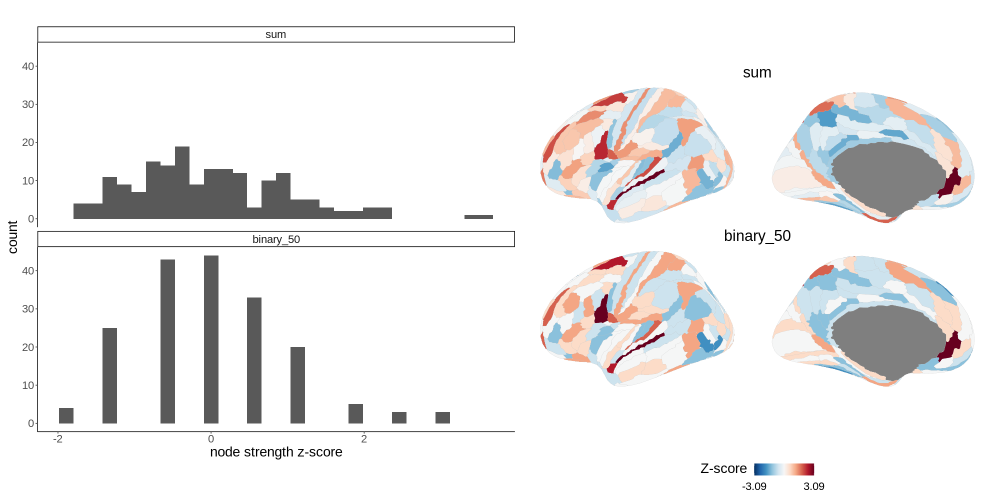

In [28]:
%%R -i strengths -w 20 -h 10 -u in -r 100
source("../code/plot_maps.R")
g1 <- strengths %>% 
    pivot_longer(everything(), names_to='map') %>% 
    mutate_at(vars(map), ~ factor(., levels=unique(.))) %>% 
    ggplot(aes(value)) + facet_wrap(~map, dir='v') + 
    xlab('node strength z-score') +
    geom_histogram() + theme_classic()

g2 <- plot_maps(strengths, ncol=1)
((g1 | g2) + plot_layout(heights=c(2,3))) & 
theme(text=element_text(size=20))

In [29]:
scatter = (maps
    .melt(ignore_index=False, var_name='map', value_name='map_score')
    .join(hcp_scores.set_index('label'))
    .melt(ignore_index=False, id_vars=['map','map_score'], var_name='G', value_name='G_score')
)

In [30]:
null_p = (corr_nulls_from_grads(null_scores, hcp_scores, maps, method='pearsonr')
                .join(scatter.groupby(['map','G']).min(), on=('map','G'))
                .rename({'map_score':'y', 'G_score':'x'},axis=1)
)

In [31]:
strengths.corr()

,sum,binary_50
sum,1.000000,0.950067
binary_50,0.950067,1.000000


/opt/conda/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: UserWarning: DataFrame contains duplicated elements in the index, which will lead to loss of the row names in the resulting data.frame
  warnings.warn('DataFrame contains duplicated elements in the index, '




`geom_smooth()` using formula = 'y ~ x'


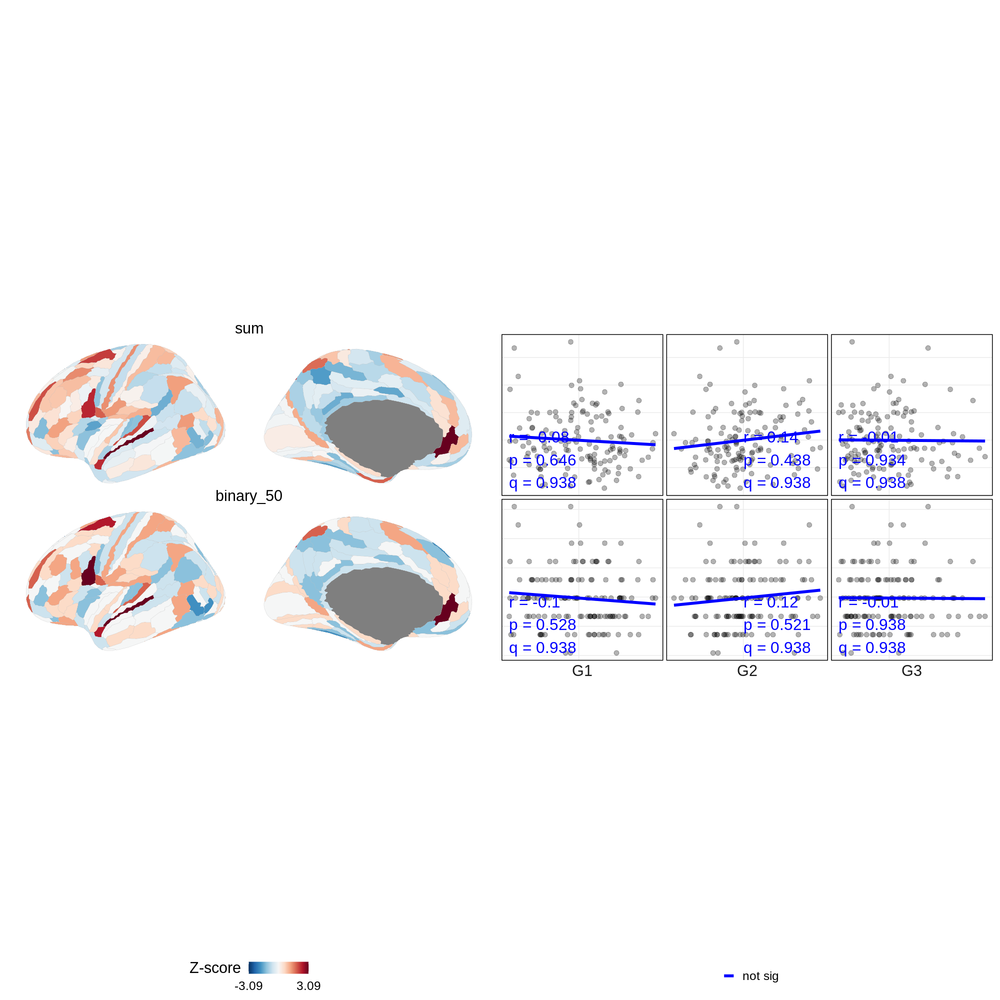

In [32]:
%%R -i hcp_scores -i maps -i scatter -i null_p -w 20 -h 20 --units in -r 100
source("../code/plot_maps.R")
g0 <- plot_hcp_wide(hcp_scores)
g1 <- plot_maps(maps, ncol=1) & theme(strip.text=element_text(size=22))

# g2 <- maps %>% 
#     pivot_longer(everything(), names_to='map') %>% 
#     mutate_at(vars(map), ~ factor(., levels=unique(.))) %>% 
#     ggplot(aes(value)) + facet_wrap(~map, dir='v', ncol=1) + 
#     xlab('z-score') +
#     geom_histogram() + theme_bw()

g3 <- plot_maps_scatter(scatter, null_p) + theme(text=element_text(size=22), strip.text.y.left=element_blank())

# (g0 / (g1 + g3)) + plot_layout(heights=c(1,4))
g1 + g3

## Distances

In [18]:
# xyz_old = fetch_hcp()['info'].set_index('id').loc[:, ['x-cog','y-cog','z-cog']].set_axis(['x','y','z'],axis=1)
xyz = pd.read_csv("../data/parcellations/centroids_HCP.csv", header=None, names=['x','y','z'])
from sklearn.metrics.pairwise import euclidean_distances
hcp_euclidean = euclidean_distances(xyz,xyz)
# hcp_euclidean_old = euclidean_distances(xyz_old,xyz_old)
# hcp_geodesic = np.loadtxt("../data/parcellations/LeftParcelGeodesicDistmat.txt")

In [2302]:
hcp_tract_lengths = mat73.loadmat("../data/averageConnectivity_tractLengths.mat")['tractLengths']
# pearsonr(hcp_euclidean.flatten(), hcp_tract_lengths.flatten())

PearsonRResult(statistic=0.7927604629515899, pvalue=0.0)

In [2006]:
pearsonr(hcp_euclidean.flatten(), hcp_euclidean_old.flatten())

PearsonRResult(statistic=0.9962163089801787, pvalue=0.0)

In [1800]:
from scipy.stats import pearsonr
pearsonr(hcp_euclidean[:180,:][:,:180].flatten(), hcp_geodesic.flatten())

PearsonRResult(statistic=0.8698092387972278, pvalue=0.0)

In [2304]:
distance_maps = (pd.DataFrame({
    'mean euclidean distance':hcp_euclidean[:180,:][:,:180].mean(0),
    'mean geodesic distance':hcp_geodesic.mean(0),
    'mean tract length': hcp_tract_lengths[:180,:][:,:180].mean(0)
}, index=range(1,181))
.assign(label=get_labels_hcp()[:180])
.set_index('label')
.apply(lambda x: (x-np.mean(x))/np.std(x))
)

                        mean euclidean distance mean geodesic distance
mean euclidean distance               1.0000000              0.8137803
mean geodesic distance                0.8137803              1.0000000
mean tract length                     0.5822820              0.7555241
                        mean tract length
mean euclidean distance         0.5822820
mean geodesic distance          0.7555241
mean tract length               1.0000000


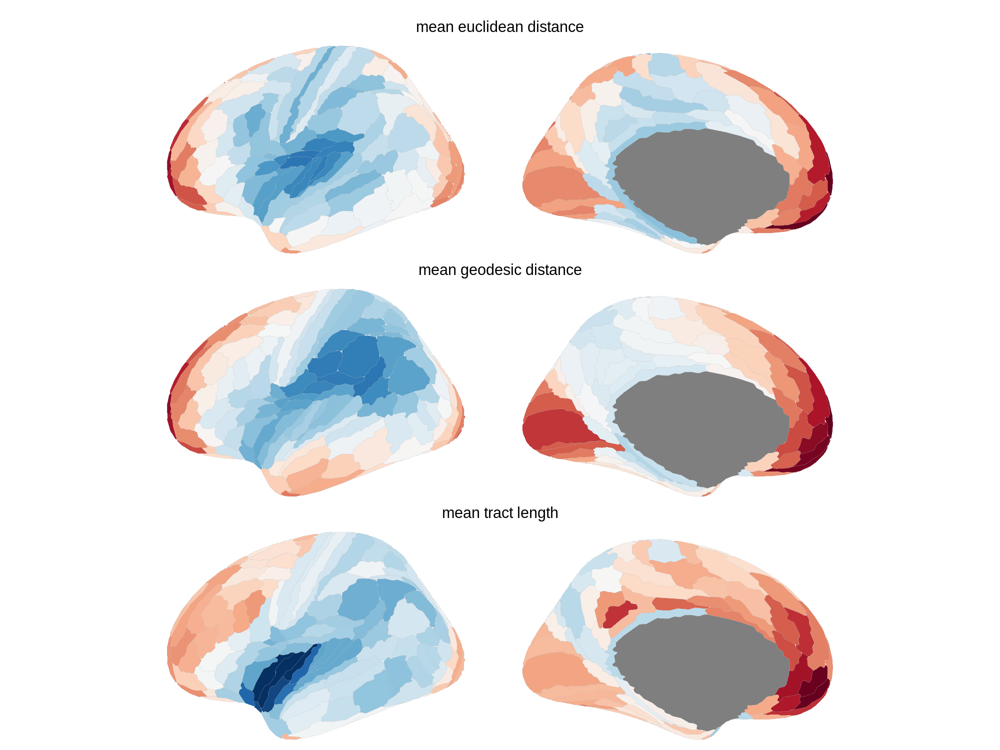

In [2307]:
%%R -i distance_maps -w 20 -h 15 -u in -r 100
print(distance_maps %>% cor(use='p'))
plot_maps(distance_maps, ncol=1) + theme(legend.position='none')

## Compare different datasets

In [2843]:
networks = {
    # 'msn': pd.read_csv("../data/MeanMSN.HCP.CT_MC_SA_SD_Vol.csv", index_col=0).values/2+.5,
    # 'mind_old_features': pd.read_csv("../data/MeanMIND.HCP.CT_MC_SA_SD_Vol.csv", index_col=0).values,
    # 'mind_new_features': pd.read_csv("../data/MeanMIND.HCP.CT_MC_MD_ICVF.not_normalized.csv", index_col=0).values,
    # # 'dti_demirtas': nib.load("../data/average_sc.pconn.nii").get_fdata(),
    # 'dti_arnatkeviciute': pd.read_csv("../data/MeanDTI_arnatkeceviute.csv", index_col=0).values,
    # # 'dti_enigma': pd.read_csv("../data/MeanDTI_enigma_toolbox.csv", index_col=0).values,
    # # 'dti_prob_trac': pd.read_csv("../data/MeanDTI_prob_trac.csv", index_col=0).values,
    # 'dti_rosen': pd.read_csv("../data/averageConnectivity_Fpt.csv", header=None).values,
    # 'fmri_demirtas': nib.load("../data/average_fc.pconn.nii").get_fdata(),

    'FC': pd.read_csv("../data/paquola_FCmatrix.csv", header=None),
    'WD': pd.read_csv("../data/paquola_WDmatrix.csv", header=None),
    'BB': pd.read_csv("../data/paquola_BBmatrix.csv", header=None),
    'MPC': pd.read_csv("../data/paquola_MPCmatrix.csv", header=None),
    'GD': pd.read_csv("../data/paquola_GDmatrix.csv", header=None),
    'TS': pd.read_csv("../data/paquola_TSmatrix.csv", header=None),
}

# for net in networks.values():
#     np.fill_diagonal(net,np.nan)

# np.fill_diagonal(networks['msn'],0)

# networks['dti_prob_trac'] = np.clip(networks['dti_prob_trac'], a_min=-6, a_max=-1)
# networks['dti_rosen'] = networks['dti_rosen']/(np.nanstd(networks['dti_rosen'])*10)
# networks['dti_rosen'] = networks['dti_rosen'] - np.nanmin(networks['dti_rosen'])

# networks['dti_demirtas'] = np.log10(networks['dti_demirtas']+.01)
# networks['dti_demirtas'] = networks['dti_demirtas']/(np.nanstd(networks['dti_demirtas'])*10)
# networks['dti_demirtas'] = networks['dti_demirtas'] - np.nanmin(networks['dti_demirtas'])

# np.fill_diagonal(networks['fmri_demirtas'],0)
# networks['fmri_demirtas'] = np.clip(networks['fmri_demirtas'], a_min=0, a_max=None)

# for net in networks.values():
#     np.fill_diagonal(net, 0)

# networks['dti_prob_trac'] = networks['dti_prob_trac']/np.std(networks['dti_prob_trac'])

In [18]:
pd.concat({name:pd.Series(net.flatten()) for name,net in networks.items()}, axis=1).describe()

,FC_demirtas,FC_paquola
count,129600.000000,129600.000000
mean,0.165743,0.191473
std,0.116990,0.129095
min,0.000000,0.000000
25%,0.079824,0.094076
50%,0.139488,0.166263
75%,0.230165,0.267534
max,0.864267,0.901380


In [2508]:
# Pearson
# df_corrs = pd.concat({name:pd.Series(net.flatten()) for name,net in networks.items()}, axis=1).corr()
# Spearman
df_corrs = pd.concat({name:pd.Series(net.flatten()) for name,net in networks.items()}, axis=1).rank().corr()
df_corrs

,msn,mind_old_features,mind_new_features,dti_demirtas,dti_arnatkeviciute,dti_enigma,dti_rosen,fmri_demirtas
msn,1.000000,0.514375,0.273420,0.009200,0.010488,0.088294,0.037544,0.069047
mind_old_features,0.514375,1.000000,0.515609,0.113258,0.124204,0.088712,0.130052,0.132698
mind_new_features,0.273420,0.515609,1.000000,0.186020,0.083369,0.125877,0.056413,0.293474
dti_demirtas,0.009200,0.113258,0.186020,1.000000,0.777994,0.401354,0.828739,0.293000
dti_arnatkeviciute,0.010488,0.124204,0.083369,0.777994,1.000000,0.249980,0.775657,0.260373
dti_enigma,0.088294,0.088712,0.125877,0.401354,0.249980,1.000000,0.410942,0.163688
dti_rosen,0.037544,0.130052,0.056413,0.828739,0.775657,0.410942,1.000000,0.174991
fmri_demirtas,0.069047,0.132698,0.293474,0.293000,0.260373,0.163688,0.174991,1.000000


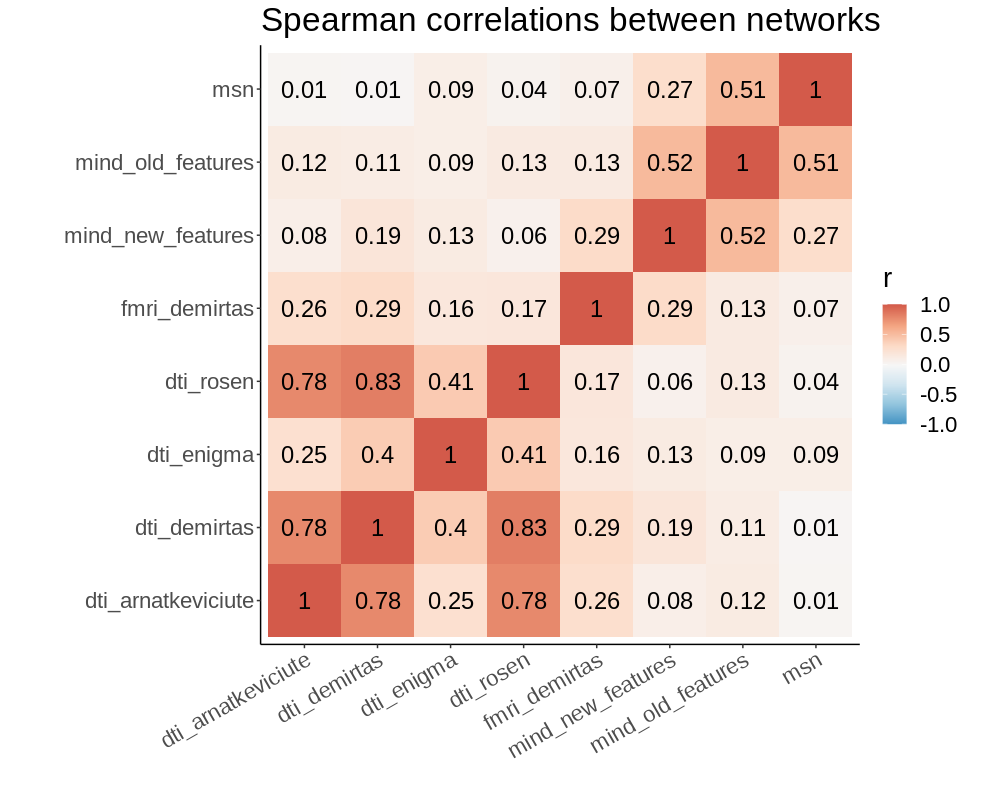

In [2510]:
%%R -i df_corrs -w 10 -h 8 -u in -r 100
df_corrs %>%
rownames_to_column('x') %>% 
pivot_longer(-x, names_to='y', values_to='r') %>% 
ggplot(aes(x,y)) + geom_raster(aes(fill=r)) + 
geom_text(aes(label=round(r,2)), size=6) + 
scale_fill_gradientn(colors=rev(brewer.rdbu(100)[20:80]), limits=c(-1,1)) +
xlab('') + ylab('') +
theme_classic() + 
theme(aspect.ratio=1,
    text=element_text(size=20),
    axis.text.x=element_text(angle=30, hjust=1),
    legend.position='right'
) +
ggtitle('Spearman correlations between networks')

### Compute modules?

Different for each network

In [1893]:
import bct
gamma = 1.06

for net in networks.values():
    np.fill_diagonal(net,0)

modules_louvain = {
    name:bct.community_louvain(net, gamma=gamma, seed=1)[0] 
    # name:bct.modularity_louvain_und(net, gamma=gamma)[0] 
    for name, net in networks.items()
}
modules_louvain['mind_old_features'].shape

(360,)

### Use Yeo modules?

Same for each network

In [1894]:
yeo = np.loadtxt("../data/parcellations/HCP_Yeo_asymmetric.txt")
yeo_names = ['Visual','Somatomotor','Dorsal Attention','Ventral Attention','Limbic','Frontoparietal','Default']

df_modules = (get_labels_hcp().to_frame()
 .assign(module = yeo)
 .assign(module_name = lambda x: x['module'].map({i+1:name for i,name in enumerate(yeo_names)}))
 .sort_values('module')
)

modules_yeo = {name:yeo for name,net in networks.items()}
modules_yeo['mind_old_features'].shape

(360,)

/opt/conda/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:65: UserWarning: Error while trying to convert the column "module_name". Fall back to string conversion. The error is: Series can only be of one type, or None (and here we have <class 'float'> and <class 'str'>). If happening with a pandas DataFrame the method infer_objects() will normalize data types before conversion.
  warnings.warn('Error while trying to convert '



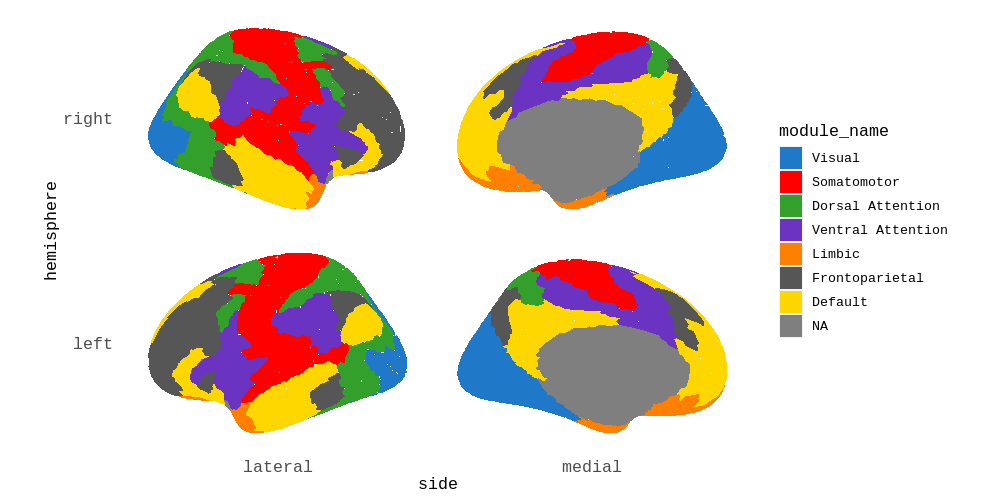

In [1895]:
%%R -i df_modules -w 10 -h 5 -u in -r 100
library(pals)
df_modules %>% rename(region=label) %>% 
mutate(module_name = factor(module_name, ordered=T, levels=unique(.$module_name))) %>% 
ggseg(atlas=glasser, position='stack', mapping=aes(fill=module_name)) + 
scale_fill_manual(values=cols25(12))

### Use Ji modules

In [1896]:
ji_networks = np.loadtxt("../data/parcellations/cortex_parcel_network_assignments.txt")
ji_network_names = ['Primary Visual', 'Secondary Visual', 'Somatomotor', 'Cingulo-Opercular', 
                    'Dorsal-Attention', 'Language', 'Frontoparietal', 'Auditory',
                    'Default',  'Posterior Multimodal', 'Ventral Multimodal', 'Orbito-Affective']
names_map = {i+1:name for i,name in enumerate(ji_network_names)}

df_modules = (get_labels_hcp().to_frame()
 .assign(module = ji_networks)
 .assign(module_name = lambda x: x['module'].map(names_map))
 .sort_values('module')
)

modules_ji = {name:ji_networks for name in networks.keys()}

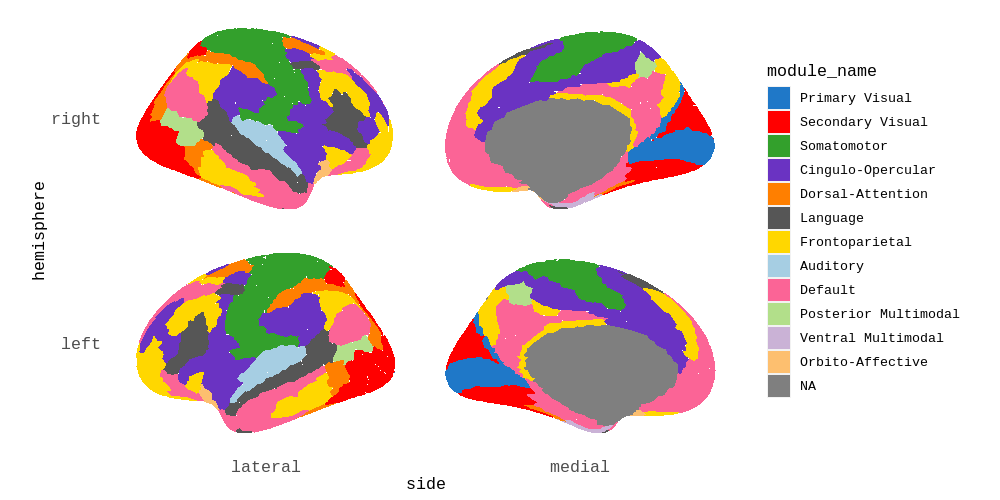

In [1897]:
%%R -i df_modules -w 10 -h 5 -u in -r 100
library(pals)
df_modules %>% rename(region=label) %>% 
mutate(module_name = factor(module_name, ordered=T, levels=unique(.$module_name))) %>% 
ggseg(atlas=glasser, position='stack',mapping=aes(fill=module_name)) + 
scale_fill_manual(values=cols25(12))

In [1946]:
modules = modules_louvain
leftright_flag = np.concatenate([np.ones(180)*100,np.ones(180)*200])
modules_leftright = {
    name:np.array([a+b for a,b in zip(leftright_flag, modules_)])
    for name,modules_ in modules.items()
}

networks_sorted = {name:net[modules_leftright[name].argsort(),:][:,modules_leftright[name].argsort()]
                   for name, net in networks.items()}

In [1947]:
networks_df = (pd.DataFrame({name:net.flatten() for name, net in networks_sorted.items()}, 
                index=pd.MultiIndex.from_product([range(360),range(360)], names=['x','y']))
                # .apply(lambda x: x/np.std(x))
                # .apply(lambda x: (x-np.mean(x))/np.std(x))
                # .apply(lambda x: x.clip(upper=np.quantile(x,.99), lower=np.quantile(x,.01)))
                )
networks_df_plot = (networks_df
                    .apply(lambda x: x.clip(upper=np.quantile(x,.99), lower=None))#np.quantile(x,.05)))
                    # .apply(lambda x: x/np.std(x))
                    .apply(lambda x: x/np.max(x))
                    # .apply(lambda x: (x-np.mean(x))/np.std(x))
                    .reset_index()
)

networks_df_plot.describe()

,x,y,msn,mind_old_features,mind_new_features,dti_arnatkeviciute,dti_rosen,fmri_demirtas
count,129600.000000,129600.000000,129600.000000,129600.000000,129600.000000,129600.000000,129600.000000,129600.000000
mean,179.500000,179.500000,0.535537,0.561107,0.523849,0.470725,0.488352,0.313499
std,103.923048,103.923048,0.246504,0.174396,0.177113,0.312490,0.170285,0.217176
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,89.750000,89.750000,0.335802,0.431193,0.403385,0.164502,0.369223,0.151650
50%,179.500000,179.500000,0.533178,0.548377,0.509365,0.487374,0.471935,0.265002
75%,269.250000,269.250000,0.736790,0.682433,0.636324,0.767452,0.588271,0.437272
max,359.000000,359.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


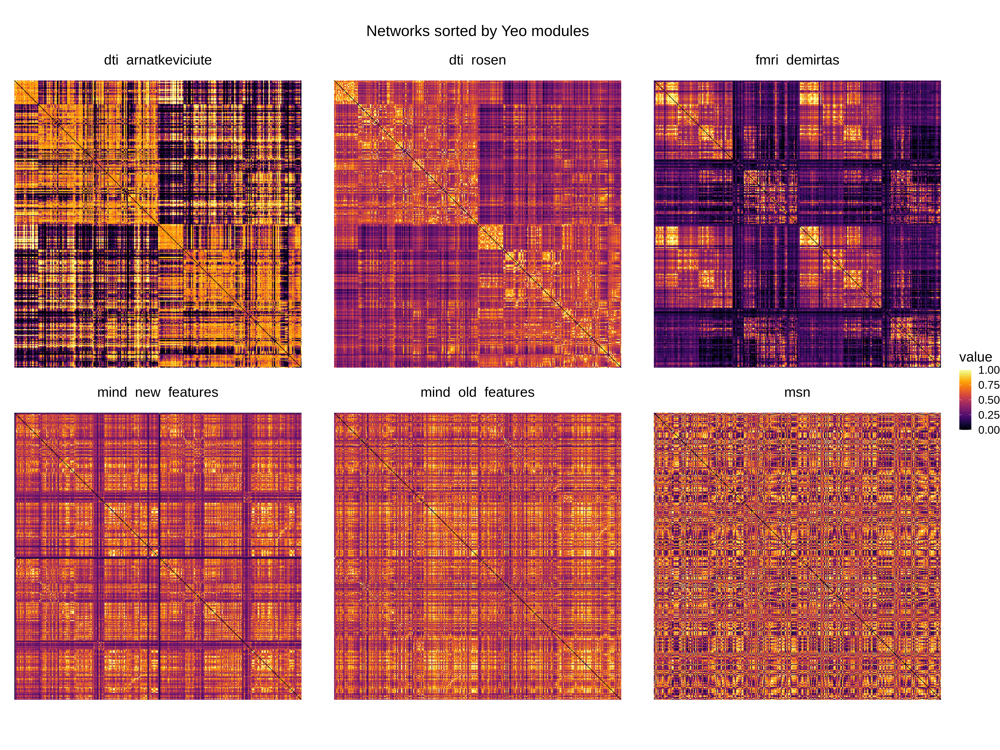

In [1942]:
%%R -i networks_df_plot -w 20 -h 15 -u in -r 200
networks_df_plot %>% 
# select(x,y,dti_prob_trac,dti_rosen) %>% 
pivot_longer(-c('x','y'), names_to='network', values_to='value') %>% 
ggplot(aes(x,y,fill=value)) +
facet_wrap(~network) +
geom_raster() + 
scale_fill_gradientn(colors=inferno(100)) +
scale_y_reverse() +
theme_void() + 
theme(
    text=element_text(size=20),
    strip.text=element_text(size=20),
    aspect.ratio=1,
    plot.title=element_text(hjust=0.5, vjust=5, size=22)
    ) +
ggtitle('Networks sorted by Yeo modules')

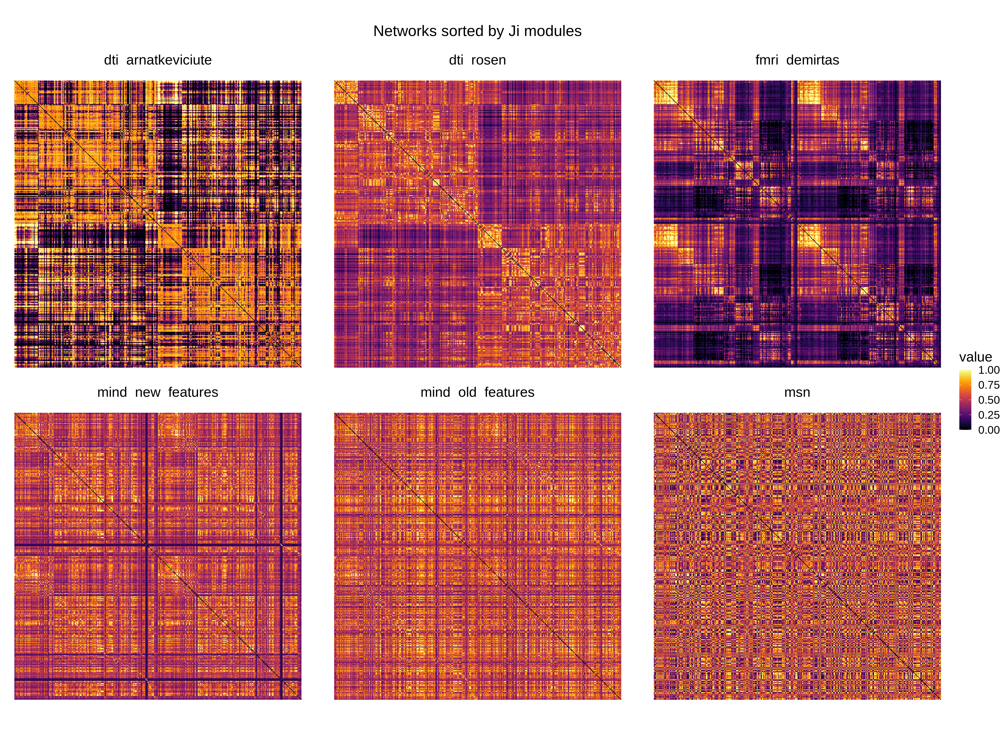

In [1945]:
%%R -i networks_df_plot -w 20 -h 15 -u in -r 200
networks_df_plot %>% 
pivot_longer(-c('x','y'), names_to='network', values_to='value') %>% 
ggplot(aes(x,y,fill=value)) +
facet_wrap(~network) +
geom_raster() + 
scale_fill_gradientn(colors=inferno(100)) +
scale_y_reverse() +
theme_void() + 
theme(
    text=element_text(size=20),
    strip.text=element_text(size=20),
    aspect.ratio=1,
    plot.title=element_text(hjust=0.5, vjust=5, size=22)
    ) +
ggtitle('Networks sorted by Ji modules')

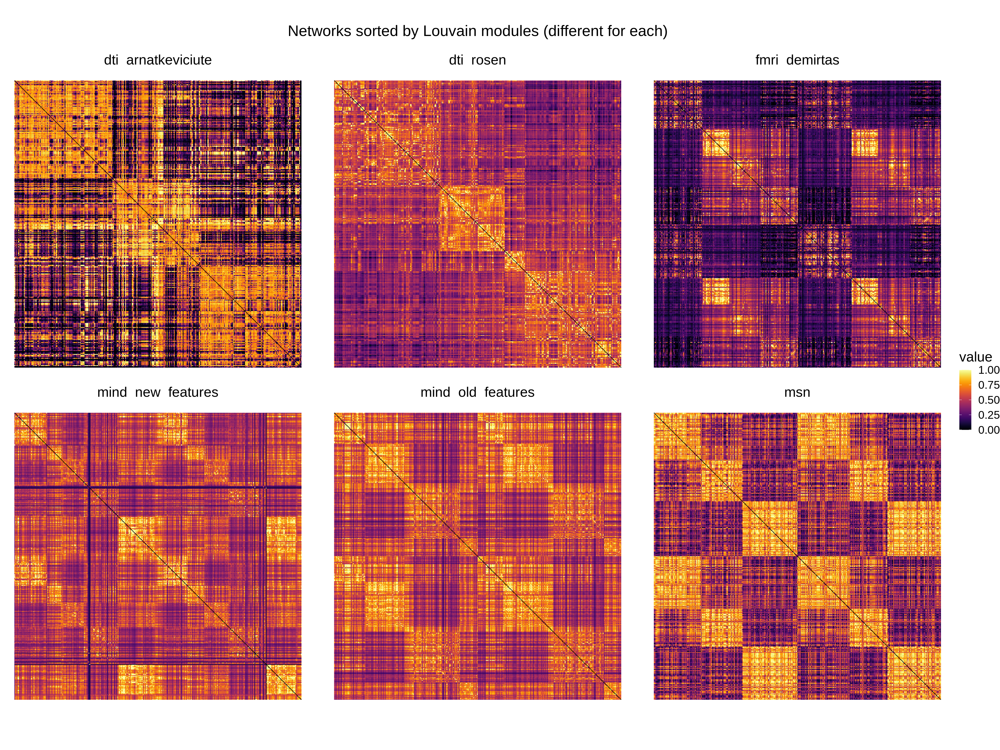

In [1948]:
%%R -i networks_df_plot -w 20 -h 15 -u in -r 200
networks_df_plot %>% 
# select(x,y,dti_prob_trac,dti_rosen) %>% 
pivot_longer(-c('x','y'), names_to='network', values_to='value') %>% 
ggplot(aes(x,y,fill=value)) +
facet_wrap(~network) +
geom_raster() + 
scale_fill_gradientn(colors=inferno(100)) +
scale_y_reverse() +
theme_void() + 
theme(
    text=element_text(size=20),
    strip.text=element_text(size=20),
    aspect.ratio=1,
    plot.title=element_text(hjust=0.5, vjust=5, size=22)
    ) +
ggtitle('Networks sorted by Louvain modules (different for each)')

In [2825]:
metrics_dict = {
    'degree (top 10%)': degree_10,
    'degree (top 30%)': degree_30,
    'strength': strengths,
    'centrality': centrality,
    'clustering': clustering,
    'intermodule strength (yeo)': strengths_intermodule_yeo,
    'intermodule strength (louvain)': strengths_intermodule_louvain,
    'participation coef (yeo)': participation_yeo,
    'participation coef (louvain)': participation_louvain,
    'total distance (top 10%)': distances_bin_10,
    'total distance (top 30%)': distances_bin_30,
    'distance-weighted strength': distance_weighted,
    'intermodule dist-wei str (yeo)': distances_intermodule_yeo,
    'intermodule dist-wei str (louvain)': distances_intermodule_louvain
}

df_metrics_corr = (pd.concat(metrics_dict)
 .melt(ignore_index=False, var_name='network', value_name='value')
 .set_index('network',append=True)
 .unstack(0)
 .droplevel(0, axis=1)
 .loc[:, metrics_dict.keys()]
 .groupby('network').corr()
 .melt(ignore_index=False, var_name='y', value_name='r')
 .reset_index().rename({'level_1':'x'}, axis=1)
)
df_metrics_corr

,network,x,y,r
0,dti_arnatkeviciute,degree (top 10%),degree (top 10%),1.000000
1,dti_arnatkeviciute,degree (top 30%),degree (top 10%),0.865826
2,dti_arnatkeviciute,strength,degree (top 10%),0.865826
3,dti_arnatkeviciute,centrality,degree (top 10%),0.796838
4,dti_arnatkeviciute,clustering,degree (top 10%),0.792651
...,...,...,...,...
1171,msn,total distance (top 10%),intermodule dist-wei str (louvain),-0.319919
1172,msn,total distance (top 30%),intermodule dist-wei str (louvain),0.176763
1173,msn,distance-weighted strength,intermodule dist-wei str (louvain),0.805107
1174,msn,intermodule dist-wei str (yeo),intermodule dist-wei str (louvain),0.657163


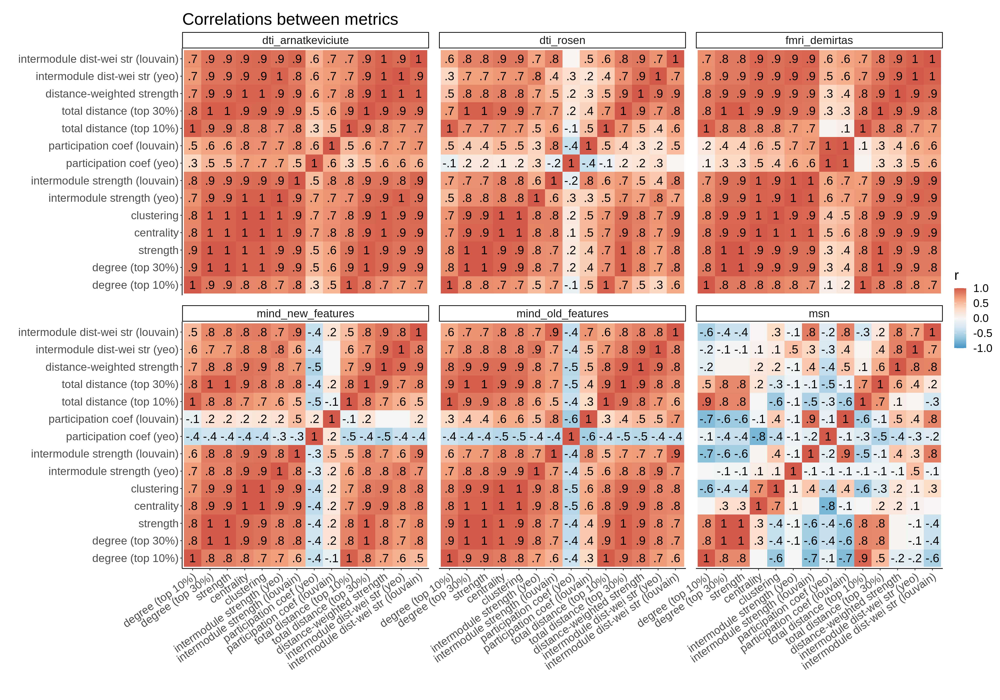

In [2839]:
%%R -i df_metrics_corr -w 20 -h 14 -u in -r 200
df_metrics_corr %>%
mutate(
    x = factor(x, ordered=T, levels=unique(.$x)),
    y = factor(y, ordered=T, levels=unique(.$y))
) %>% 
ggplot(aes(x,y)) + 
facet_wrap(~network, ncol=3) +
geom_raster(aes(fill=r)) + 
geom_text(aes(label=str_replace(round(r,1), '0','')), size=6) + 
scale_fill_gradientn(colors=rev(brewer.rdbu(100)[20:80]), limits=c(-1,1)) +
xlab('') + ylab('') +
theme_classic() + 
theme(aspect.ratio=1,
    text=element_text(size=20),
    axis.text.x=element_text(angle=35, hjust=1),
    legend.position='right',
    panel.spacing=unit(1,'lines')
) +
ggtitle('Correlations between metrics')